In [1]:
import os
import numpy as np
import librosa
import librosa.display
import librosa.feature
import matplotlib.pyplot as plt
import IPython.display as ipd
import math
import scipy
import itertools
import tensorflow as tf
import concurrent.futures
import seaborn as sn

In [2]:
TEMPO_DATA_PATH = "TempoData"
file_paths = []
for label in os.listdir(TEMPO_DATA_PATH):
    if label != '.DS_Store':
        for file_name in os.listdir(TEMPO_DATA_PATH + "/" + label):
            file_paths.append(TEMPO_DATA_PATH + "/" + label + "/" + file_name)

In [3]:
test_y, test_sr = librosa.load("TempoData/80.0/1973680.LOFI.wav")
test_y_sr = (test_y, test_sr)

In [4]:
# Standardize BPM function
BPM_MAX = 200
BPM_MIN = 60
def normalize_bpm(theor_bpm):
    new_bpm = theor_bpm
    while (new_bpm < 60):
        new_bpm *= 2
    while (new_bpm > 200):
        new_bpm /=2
    return new_bpm

In [5]:
# Scale observed bpm to value closest to actual, accounts for octave error
def best_bpm_fit(observed, actual):
    new_bpm = observed
    while abs(actual - (new_bpm*2)) < abs(actual - new_bpm):
        new_bpm *= 2
    while abs(actual - (new_bpm/2)) < abs(actual - new_bpm):
        new_bpm /= 2
    return new_bpm

In [6]:
def calc_rmse(predictions, actual):
    return np.sqrt(np.mean((predictions-actual)**2))

In [7]:
def calc_mape(predictions, actual):
    return np.mean(np.abs((actual - predictions) / actual)) * 100

**Lowpass Filter Algorithm**

In [8]:
import tempo_detection_utils

In [9]:
y, sr, filtered, lpf_bpm_pred = tempo_detection_utils.lpf_algorithm(test_y_sr)
print(f"LPF Algorithm BPM Pred: {lpf_bpm_pred}")
ipd.Audio(filtered, rate=sr)


LPF Processing File
LPF Algorithm BPM Pred: 112


**Sound Energy Algorithm**

In [10]:
y, sr, se_bpm_pred = tempo_detection_utils.sound_energy_algorithm(test_y_sr)
print(f"SE Algorithm BPM Pred: {se_bpm_pred}")
ipd.Audio(y, rate=sr)

SE Processing File
SE Algorithm BPM Pred: 148.5


In [10]:
tempo_detection_utils.tempo_eval(file_paths)

Loading file TempoData/86.0/3914630.LOFI.wav...
Loading file TempoData/133.0/2704868.LOFI.wav...
Loading file TempoData/86.0/3789981.LOFI.wav...
Loading file TempoData/86.0/3414746.LOFI.wav...
Loading file TempoData/139.0/4122833.LOFI.wav...
Loading file TempoData/86.0/1114156.LOFI.wav...
Loading file TempoData/86.0/4346730.LOFI.wav...
Loading file TempoData/139.0/4106593.LOFI.wav...
Loading file TempoData/139.0/825292.LOFI.wav...
Loading file TempoData/139.0/536656.LOFI.wav...
Loading file TempoData/139.0/3558940.LOFI.wav...
Loading file TempoData/139.0/4067151.LOFI.wav...
Loading file TempoData/139.0/4860099.LOFI.wav...
Loading file TempoData/139.0/3230949.LOFI.wav...
Loading file TempoData/139.0/3865706.LOFI.wav...
Loading file TempoData/139.0/3853477.LOFI.wav...
Loading file TempoData/139.0/3218804.LOFI.wav...
Loading file TempoData/139.0/3512227.LOFI.wav...
Loading file TempoData/139.0/4460536.LOFI.wav...
Loading file TempoData/139.0/4486412.LOFI.wav...
Loading file TempoData/139.

/Users/nickhansen/PersonalProjects/Senior Project/tempo_detection_utils.py:162: RuntimeWarning: divide by zero encountered in true_divide
  bpm_axis = (60/t)[::-1]
/Users/nickhansen/PersonalProjects/Senior Project/tempo_detection_utils.py:162: RuntimeWarning: divide by zero encountered in true_divide
  bpm_axis = (60/t)[::-1]


NO Processing File
NO Processing File


/Users/nickhansen/PersonalProjects/Senior Project/tempo_detection_utils.py:162: RuntimeWarning: divide by zero encountered in true_divide
  bpm_axis = (60/t)[::-1]
/Users/nickhansen/PersonalProjects/Senior Project/tempo_detection_utils.py:162: RuntimeWarning: divide by zero encountered in true_divide
  bpm_axis = (60/t)[::-1]
/Users/nickhansen/PersonalProjects/Senior Project/tempo_detection_utils.py:162: RuntimeWarning: divide by zero encountered in true_divide
  bpm_axis = (60/t)[::-1]
/Users/nickhansen/PersonalProjects/Senior Project/tempo_detection_utils.py:162: RuntimeWarning: divide by zero encountered in true_divide
  bpm_axis = (60/t)[::-1]
/Users/nickhansen/PersonalProjects/Senior Project/tempo_detection_utils.py:162: RuntimeWarning: divide by zero encountered in true_divide
  bpm_axis = (60/t)[::-1]
/Users/nickhansen/PersonalProjects/Senior Project/tempo_detection_utils.py:162: RuntimeWarning: divide by zero encountered in true_divide
  bpm_axis = (60/t)[::-1]
/Users/nickhanse

NO Processing File
NO Processing File
NO Processing File
NO Processing File
NO Processing File
NO Processing File
NO Processing File


/Users/nickhansen/PersonalProjects/Senior Project/tempo_detection_utils.py:162: RuntimeWarning: divide by zero encountered in true_divide
  bpm_axis = (60/t)[::-1]


NO Processing File
NO Processing File
NO Processing File
NO Processing File
NO Processing File
NO Processing File
NO Processing File
NO Processing File
NO Processing File
NO Processing File
NO Processing File
NO Processing File
NO Processing File
NO Processing File
NO Processing File
NO Processing File
NO Processing File
NO Processing File
NO Processing File
NO Processing File
NO Processing File
NO Processing File
NO Processing File
NO Processing File
NO Processing File
NO Processing File
NO Processing File
NO Processing File
NO Processing File
NO Processing File
NO Processing File
NO Processing File
NO Processing File
NO Processing File
NO Processing File
NO Processing File
NO Processing File
NO Processing File
NO Processing File
NO Processing File
NO Processing File
NO Processing File
NO Processing File
NO Processing File
NO Processing File
NO Processing File
NO Processing File
NO Processing File
NO Processing File
NO Processing File
NO Processing File
NO Processing File
NO Processin

**Data Viz**

In [112]:
arr_path = "pred_arr.txt"

arr_file = open(arr_path, "r")
lines = arr_file.readlines()

actual = []
lpf_pred = []
se_pred = []
no_pred = []

for i, l in enumerate(lines):
    l = l.split(": ")[1]
    l = l.replace("[", "").replace("]", "").strip()
    arr = l.split(", ")
    arr = [float(x) for x in arr]
    if i == 0:
        actual = arr
    elif i == 1:
        lpf_pred = arr
    elif i == 2:
        se_pred = arr
    elif i == 3:
        no_pred = arr

actual = np.array(actual)
lpf_pred = np.array(lpf_pred)
se_pred = np.array(se_pred)
no_pred = np.array(no_pred)

print(len(actual))

print(f"LPF RMSE: {calc_rmse(lpf_pred, actual)}")
print(f"SE RMSE: {calc_rmse(se_pred, actual)}")
print(f"NO RMSE: {calc_rmse(no_pred, actual)}")

print(f"LPF MAPE: {calc_mape(lpf_pred, actual)}")
print(f"SE MAPE: {calc_mape(se_pred, actual)}")
print(f"NO MAPE: {calc_mape(no_pred, actual)}")

661
LPF RMSE: 30.133188964260395
SE RMSE: 27.79860478900082
NO RMSE: 21.684163483352446
LPF MAPE: 18.043761015032405
SE MAPE: 16.861170014510616
NO MAPE: 7.847090899084604


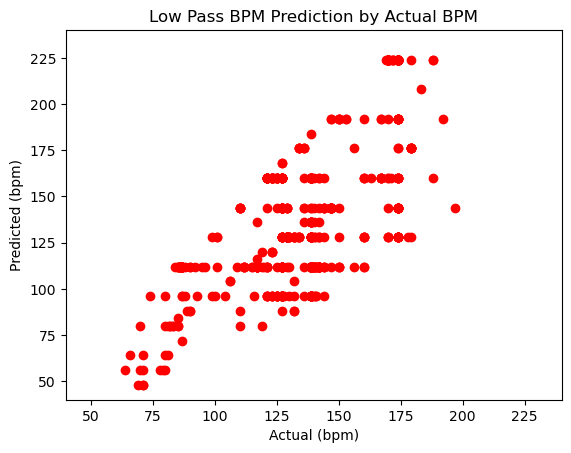

In [147]:
plt.scatter(actual, lpf_pred, c='r')
plt.xlabel("Actual (bpm)")
plt.ylabel("Predicted (bpm)")
plt.ylim(40, 240)
plt.xlim(40, 240)
plt.title("Low Pass BPM Prediction by Actual BPM")
plt.show()

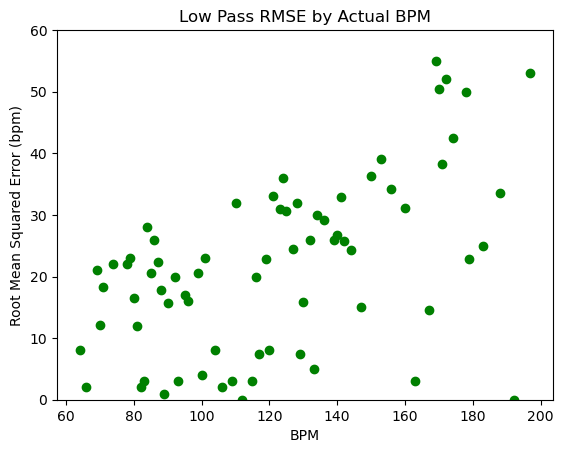

In [125]:
lpf_rmse_dict = {}

for i, true_bpm in enumerate(actual):
    if true_bpm in lpf_rmse_dict:
        lpf_rmse_dict[true_bpm].append(lpf_pred[i])
    else:
        lpf_rmse_dict[true_bpm] = [lpf_pred[i]]

for k,v in lpf_rmse_dict.items():
    lpf_rmse_dict[k] = calc_rmse(np.array(v), np.array([k for _ in range(0, len(v))]))

lpf_keys = lpf_rmse_dict.keys()
lpf_rmse = lpf_rmse_dict.values()

plt.scatter(lpf_keys, lpf_rmse, color='g')
plt.xlabel("BPM")
plt.ylabel("Root Mean Squared Error (bpm)")
plt.ylim(0, 60)
plt.title("Low Pass RMSE by Actual BPM")
plt.show()

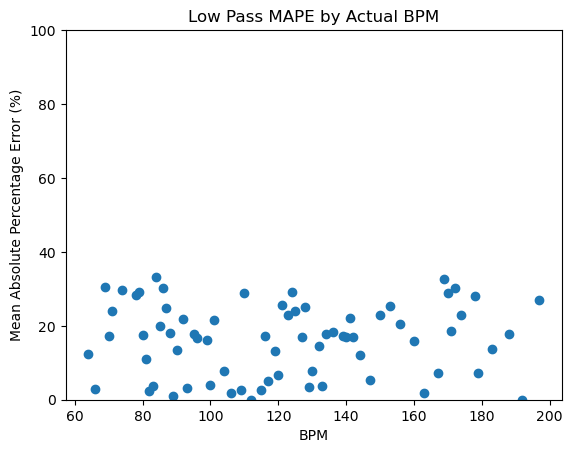

In [140]:
lpf_mape_dict = {}

for i, true_bpm in enumerate(actual):
    if true_bpm in lpf_mape_dict:
        lpf_mape_dict[true_bpm].append(lpf_pred[i])
    else:
        lpf_mape_dict[true_bpm] = [lpf_pred[i]]

for k,v in lpf_mape_dict.items():
    lpf_mape_dict[k] = calc_mape(np.array(v), np.array([k for _ in range(0, len(v))]))

lpf_keys = lpf_mape_dict.keys()
lpf_mape = lpf_mape_dict.values()

plt.scatter(lpf_keys, lpf_mape)
plt.xlabel("BPM")
plt.ylabel("Mean Absolute Percentage Error (%)")
plt.ylim(0, 100)
plt.title("Low Pass MAPE by Actual BPM")
plt.show()

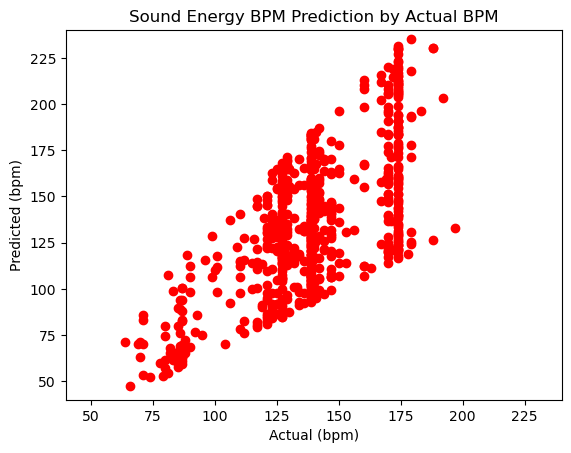

In [146]:
plt.scatter(actual, se_pred, c='r')
plt.xlabel("Actual (bpm)")
plt.ylabel("Predicted (bpm)")
plt.ylim(40, 240)
plt.xlim(40, 240)
plt.title("Sound Energy BPM Prediction by Actual BPM")
plt.show()

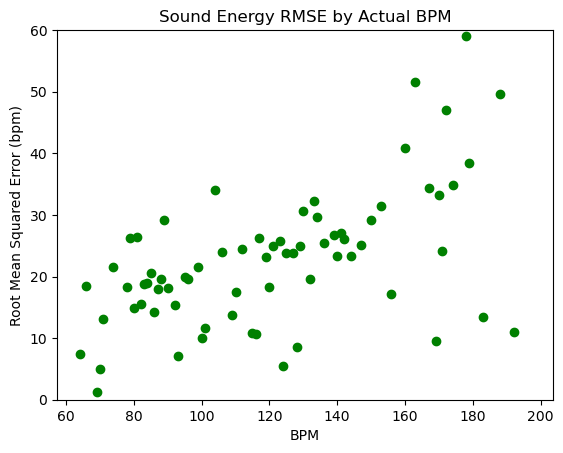

In [129]:
se_rmse_dict = {}

for i, true_bpm in enumerate(actual):
    if true_bpm in se_rmse_dict:
        se_rmse_dict[true_bpm].append(se_pred[i])
    else:
        se_rmse_dict[true_bpm] = [se_pred[i]]

for k,v in se_rmse_dict.items():
    se_rmse_dict[k] = calc_rmse(np.array(v), np.array([k for _ in range(0, len(v))]))

se_keys = se_rmse_dict.keys()
se_rmse = se_rmse_dict.values()

plt.scatter(se_keys, se_rmse, c='g')
plt.xlabel("BPM")
plt.ylabel("Root Mean Squared Error (bpm)")
plt.ylim(0, 60)
plt.title("Sound Energy RMSE by Actual BPM")
plt.show()

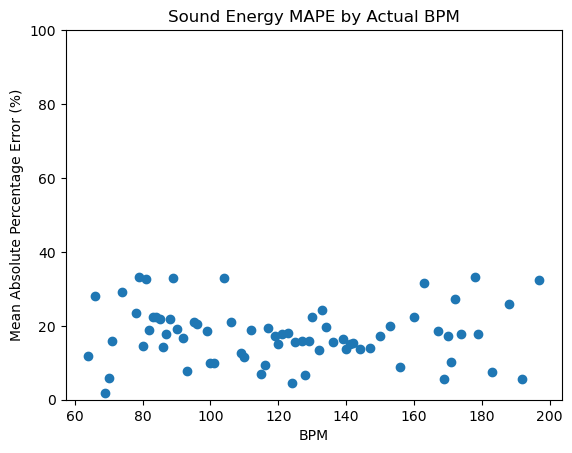

In [139]:
se_mape_dict = {}

for i, true_bpm in enumerate(actual):
    if true_bpm in se_mape_dict:
        se_mape_dict[true_bpm].append(se_pred[i])
    else:
        se_mape_dict[true_bpm] = [se_pred[i]]

for k,v in se_mape_dict.items():
    se_mape_dict[k] = calc_mape(np.array(v), np.array([k for _ in range(0, len(v))]))

se_keys = se_mape_dict.keys()
se_mape = se_mape_dict.values()

plt.scatter(se_keys, se_mape)
plt.xlabel("BPM")
plt.ylabel("Mean Absolute Percentage Error (%)")
plt.ylim(0, 100)
plt.title("Sound Energy MAPE by Actual BPM")
plt.show()

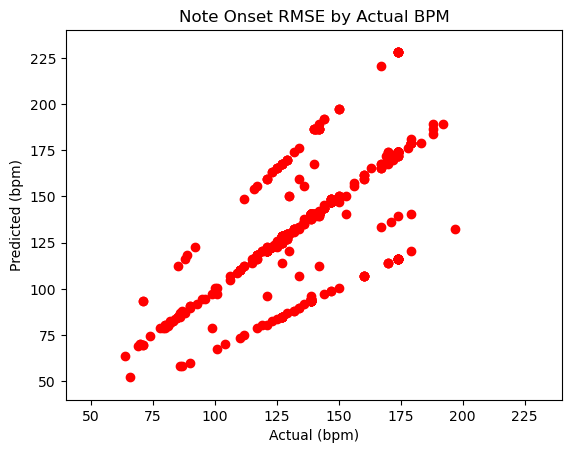

In [149]:
plt.scatter(actual, no_pred, c='r')
plt.xlabel("Actual (bpm)")
plt.ylabel("Predicted (bpm)")
plt.ylim(40, 240)
plt.xlim(40, 240)
plt.title("Note Onset RMSE by Actual BPM")
plt.show()

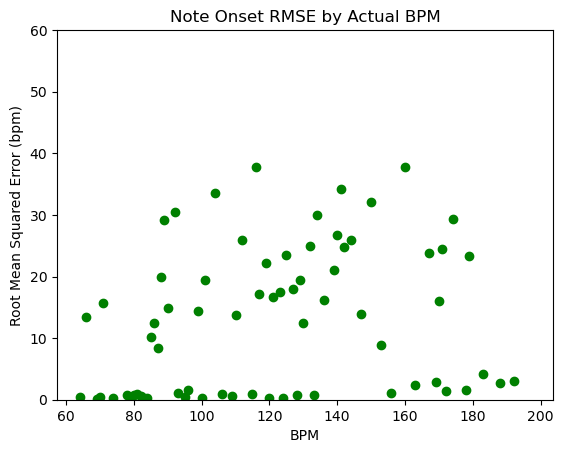

In [136]:
no_rmse_dict = {}

for i, true_bpm in enumerate(actual):
    if true_bpm in no_rmse_dict:
        no_rmse_dict[true_bpm].append(no_pred[i])
    else:
        no_rmse_dict[true_bpm] = [no_pred[i]]

for k,v in no_rmse_dict.items():
    no_rmse_dict[k] = calc_rmse(np.array(v), np.array([k for _ in range(0, len(v))]))

no_keys = no_rmse_dict.keys()
no_rmse = no_rmse_dict.values()

plt.scatter(no_keys, no_rmse, c='g')
plt.xlabel("BPM")
plt.ylabel("Root Mean Squared Error (bpm)")
plt.ylim(0, 60)
plt.title("Note Onset RMSE by Actual BPM")
plt.show()


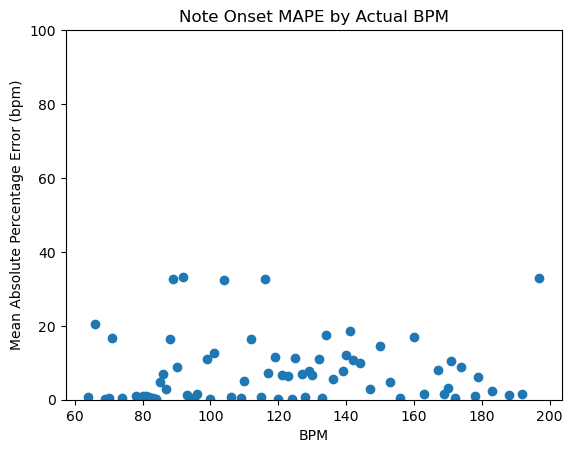

In [138]:
no_mape_dict = {}

for i, true_bpm in enumerate(actual):
    if true_bpm in no_mape_dict:
        no_mape_dict[true_bpm].append(no_pred[i])
    else:
        no_mape_dict[true_bpm] = [no_pred[i]]

for k,v in no_mape_dict.items():
    no_mape_dict[k] = calc_mape(np.array(v), np.array([k for _ in range(0, len(v))]))

no_keys = no_mape_dict.keys()
no_mape = no_mape_dict.values()

plt.scatter(no_keys, no_mape)
plt.xlabel("BPM")
plt.ylabel("Mean Absolute Percentage Error (bpm)")
plt.ylim(0, 100)
plt.title("Note Onset MAPE by Actual BPM")
plt.show()